<a href="https://colab.research.google.com/github/james811223/HR-Employees-Attrition-Analysis/blob/master/Employee_attrition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Setup

## Import packages

In [ ]:
!pip uninstall seaborn pandas_profiling
!pip install pandas-profiling seaborn
import os, pandas as pd, seaborn as sns, numpy as np, matplotlib.pyplot as plt, re
from sklearn.metrics import classification_report as rep
%matplotlib inline
from pandas_profiling import ProfileReport
from sklearn.preprocessing import MinMaxScaler as mms
from scipy.stats import iqr
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from imblearn.combine import SMOTETomek
from sklearn import metrics

In [2]:
sns.set_style('darkgrid',{'figure.facecolor': 'lightblue'})

## Download Data from [Kaggle](https://www.kaggle.com/vjchoudhary7/hr-analytics-case-study?select=general_data.csv#)

In [ ]:
kg = {"username":"*********","key":"**********"}
os.environ['KAGGLE_USERNAME'] = kg['username']
os.environ['KAGGLE_KEY'] = kg['key']
!kaggle datasets download -d vjchoudhary7/hr-analytics-case-study
!unzip hr-analytics-case-study.zip

## Read in data

In [4]:
employee_survey = pd.read_csv('employee_survey_data.csv')
data = pd.read_csv('general_data.csv')
in_time = pd.read_csv('in_time.csv')
manager_survey = pd.read_csv('manager_survey_data.csv')
out_time = pd.read_csv('out_time.csv')

# Data profiling and data wrangling

## employee_survey

In [54]:
employee_survey.profile_report()

* Very little missing values

In [ ]:
employee_survey.dtypes

EmployeeID                   int64
EnvironmentSatisfaction    float64
JobSatisfaction            float64
WorkLifeBalance            float64
dtype: object

### Convert data types to int

In [ ]:
employee_survey = employee_survey.convert_dtypes()
employee_survey.dtypes

EmployeeID                 Int64
EnvironmentSatisfaction    Int64
JobSatisfaction            Int64
WorkLifeBalance            Int64
dtype: object

## Main data

In [55]:
data.profile_report()

* Education needs to be decoded.
* EmployeeCount column is constant.
* Over18 column is constant.
* StandardHours column is constant.






### Decode education and drop constant columns

In [5]:
ed_dict = {1: 'Below College', 2: 'College', 3: 'Bachelor', 4: 'Master', 5: 'Doctor'}
data.Education = data.Education.map(ed_dict)
data.drop(columns = ['EmployeeCount', 'Over18', 'StandardHours'], inplace = 1 == 1)

### Check for high correlation columns

In [6]:
def high_corr_col(data, thresh = .7):
    '''
    thresh must be positive.
    Return dataframe showing highly correlated column names with their correlations.
    '''
    tdf = data.corr().reset_index().melt('index', data.select_dtypes('number').columns)
    tdf = tdf[tdf['index'] != tdf.variable].query('(value > @thresh or value < -@thresh) and value < 1')
    tdf = tdf.rename(columns = {'value': 'correlation'}).drop_duplicates('correlation')
    tdf.columns = ['column_1', 'column_2', 'correlation']
    return tdf
high_corr_col(data)

,column_1,column_2,correlation
142,YearsWithCurrManager,YearsAtCompany,0.769212


* These 2 columns are highly correlated and needs to be dealt with.

## in_time

### Convert data from wide to long format

In [7]:
in_time = in_time.melt(in_time.columns[0], in_time.columns[1:])
in_time.columns = ['EmployeeID', 'Date', 'Login']
in_time.Date = pd.to_datetime(in_time.Date)
in_time.Login = pd.to_datetime(in_time.Login).dt.time

### Remove the dates with no logins

In [8]:
s = in_time.groupby('Date').agg({'Login': (lambda x: x.isna().mean())})
dates = s.query('Login == 1').index.to_list()
in_time = in_time[in_time.Date.isin(dates) == False]

## manager_survey

In [ ]:
manager_survey.profile_report()

## out_time

### Convert data from wide to long format

In [10]:
out_time = out_time.melt(out_time.columns[0], out_time.columns[1:])
out_time.columns = ['EmployeeID', 'Date', 'Logout']
out_time.Date = pd.to_datetime(out_time.Date)
out_time.Logout = pd.to_datetime(out_time.Logout).dt.time

### Remove the dates with no logouts

In [11]:
s = out_time.groupby('Date').agg({'Logout': (lambda x: x.isna().mean())})
dates = s.query('Logout == 1').index.to_list()
out_time = out_time[out_time.Date.isin(dates) == False]

## Join in_time and out_time

In [12]:
log = in_time.merge(out_time, 'outer', ['EmployeeID', 'Date'])

### Add work_hrs

In [13]:
def time_diff_hr(a, b):
    a_min, b_min = map(lambda x: x.hour * 60 + x.minute, [a, b])
    return abs(a_min - b_min) / 60
log['work_hrs'] = [time_diff_hr(o, i) for o, i in zip(log.Logout, log.Login)]

## Join employee_survey and manager_survey

In [14]:
survey = employee_survey.merge(manager_survey, 'outer', on ='EmployeeID')

# EDA

In [15]:
def donut_chart(by, data = data, autopct = '%1.1f%%', val = 'Attrition', R = 1, r = .8, pctdistance = .5, hole_col = 'lightblue', center = (0, 0), 
                title = '', figsize = (8, 3.5), ncol = None):
    '''
    val(str): Column name for the values to be used for the graph.

    data(Pandas dataframe): Data

    autopct(str, or function): String or function used to label the wedges with their numeric value. If it is a format string, the label will be fmt%pct. If it is a function, it will be called.
    
    by(str): Optional column name to be used for the categories to create mutiple donut charts.
    
    R/r(int, or float): Radius for the donut/hole.
    
    hole_col(str): Color for the hole.
    
    center(tuple): Center for the donut.
    
    title(str): Title
    
    figsize(tuple): Figure width, height in inches.

    pctdistance(float): The radial distance at which the pie labels are drawn. If set to None, label are not drawn.

    ncol(int): Number of columns for subplots.
    '''
    if by == None:
        t = data[val].value_counts()
        plt.pie(t, labels = t.index, autopct = autopct, radius = R, pctdistance = pctdistance)
        plt.title(title)
        plt.gca().add_artist(plt.Circle(center, radius = r, fc = hole_col))
    else:
        by_part = np.sort(data[by].unique())
        n_part = len(by_part)
        ncol = len(by_part) if ncol == None else ncol
        fig, axs = plt.subplots(int(np.ceil(n_part / ncol)), ncol, figsize = figsize)
        fig.suptitle(title, size = 20)
        ax_iter = iter(axs.flatten())
        for p in by_part:
            ax = next(ax_iter)
            t = data.query(f'{by} == "{p}"')[val].value_counts().sort_index()
            ax.pie(t, autopct = autopct, radius = R, pctdistance = pctdistance)
            ax.set_title(f'{by}:\n{p}')
            ax.add_artist(plt.Circle(center, radius = r, fc = hole_col))
        fig.legend(t.index, title = val, loc = 'upper right')
        while True:
            try:
                next(ax_iter).pie([])
            except:
                break

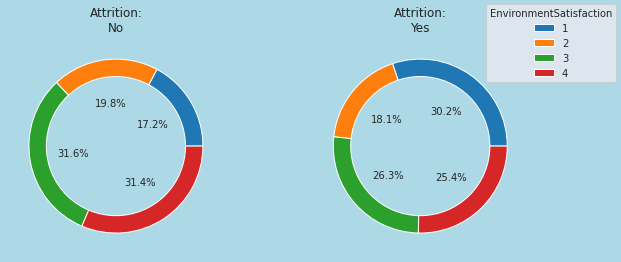

In [ ]:
donut_chart('Attrition', data = label(survey), val = 'EnvironmentSatisfaction', figsize = (10, 4))

* Employees who left are generally more unsatisfied about the work environment than employees who stayed.

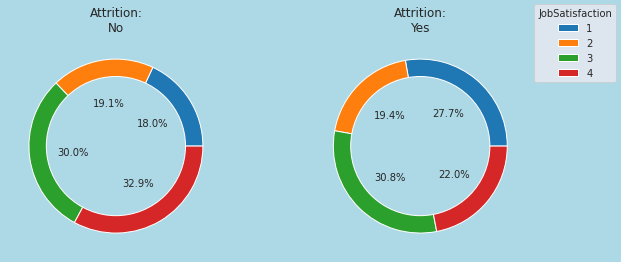

In [ ]:
donut_chart('Attrition', data = label(survey), val = 'JobSatisfaction', figsize = (10, 4))

* Employees who left are generally more unsatisfied about the job than employees who stayed.

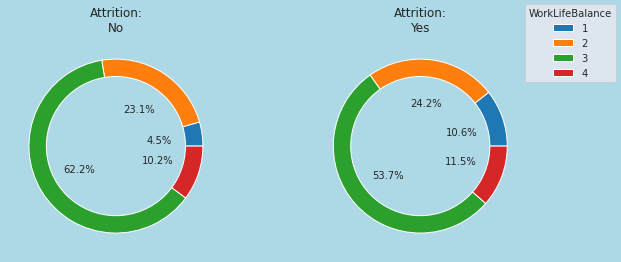

In [ ]:
donut_chart('Attrition', data = label(survey), val = 'WorkLifeBalance', figsize = (10, 4))

* Employees who left are generally more unsatisfied about the work life balance than employees who stayed.

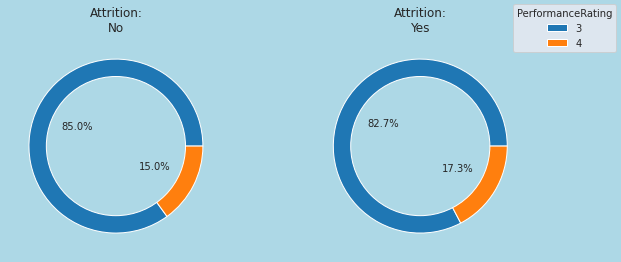

In [ ]:
donut_chart('Attrition', data = label(survey), val = 'PerformanceRating', figsize = (10, 4))

* Employees who left seem to perform a little better than those who stayed.

In [16]:
def plot_dist(by, data = data, title = None): 
    p = sns.violinplot(data = data, y = by, x = 'Attrition', inner = 'quartile', cut = 0)
    p.set_title(f'{by} distribution by attrition status' if title == None else title)
    _ = p.set_ylabel('')

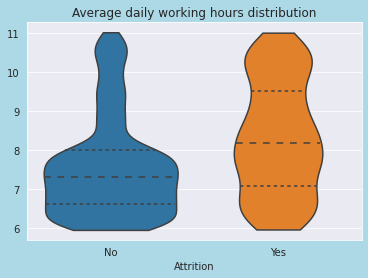

In [ ]:
label = lambda df:df.merge(data[['EmployeeID', 'Attrition']], on = 'EmployeeID')
tdf = log.groupby('EmployeeID').agg({'work_hrs': np.mean}).reset_index()
df= label(tdf)
plot_dist('work_hrs', data = df, title = 'Average daily working hours distribution')

* Employees who left seems to have more average daily working hours than employees who stayed in general.

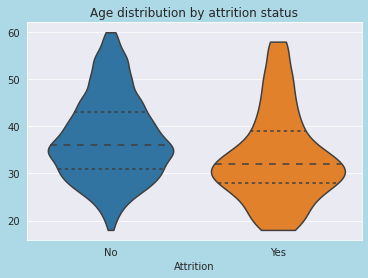

In [ ]:
plot_dist('Age')

* Employees who left seems to be younger than employees who stayed in general.

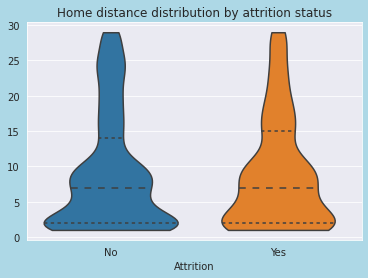

In [ ]:
plot_dist('DistanceFromHome', title = 'Home distance distribution by attrition status')

* Home distance distribution between Employees who left and those stayed looks pretty much the same.

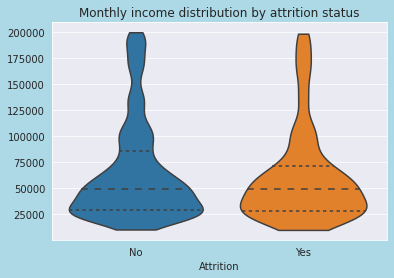

In [ ]:
plot_dist('MonthlyIncome', title = 'Monthly income distribution by attrition status')

* Monthly income distribution between Employees who left and those stayed looks pretty much the same.

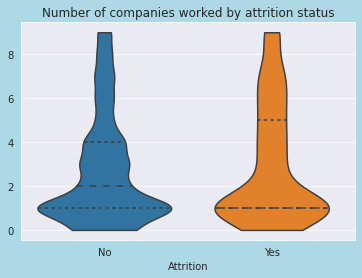

In [ ]:
plot_dist('NumCompaniesWorked', title = 'Number of companies worked by attrition status')

* Number of companies worked distribution between Employees who left and those stayed are pretty similar.

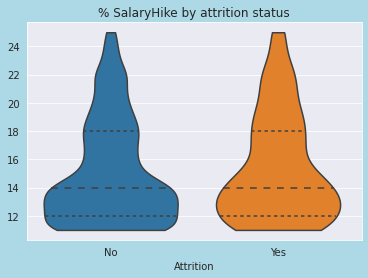

In [ ]:
plot_dist('PercentSalaryHike', title = '% SalaryHike by attrition status')

* % salary hike distribution between Employees who left and those stayed are pretty similar.

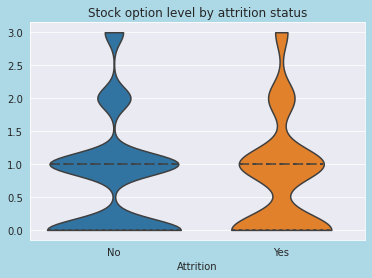

In [ ]:
plot_dist('StockOptionLevel', title = 'Stock option level by attrition status')

* Stock option level distribution between Employees who left and those stayed are pretty similar.

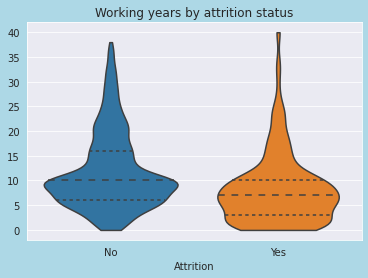

In [ ]:
plot_dist('TotalWorkingYears', title = 'Working years by attrition status')

* Employees who left seems to have less working years than employees who stayed in general.

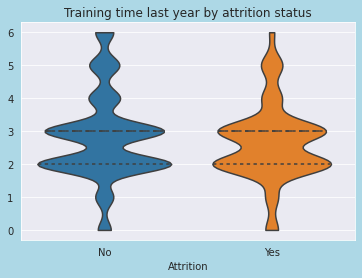

In [ ]:
plot_dist('TrainingTimesLastYear', title = 'Training time last year by attrition status')

* Training time last year distribution between Employees who left and those stayed are pretty similar.

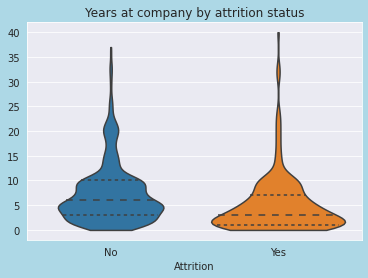

In [ ]:
plot_dist('YearsAtCompany', title = 'Years at company by attrition status')

* Employees who left seems to have less years at company than employees who stayed in general.

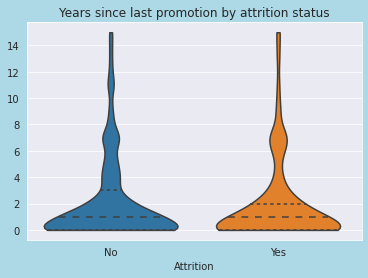

In [ ]:
plot_dist('YearsSinceLastPromotion', title = 'Years since last promotion by attrition status')

* Years since last promotion distribution between Employees who left and those stayed are pretty similar.

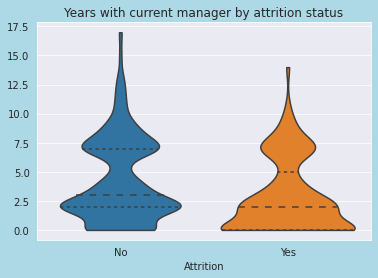

In [ ]:
plot_dist('YearsWithCurrManager', title = 'Years with current manager by attrition status')

* Employees who left seems to have less years with current manager than employees who stayed in general.

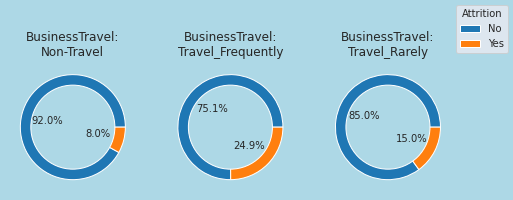

In [ ]:
donut_chart('BusinessTravel')

* Employees who travels frequently seems to be having higher attrition rate than those who don't.

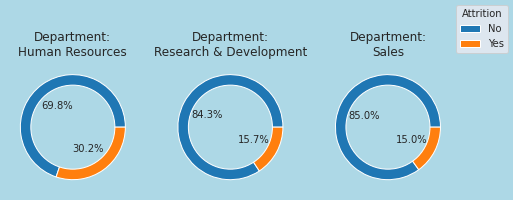

In [ ]:
donut_chart(by = 'Department', val = 'Attrition')

* HR has by far the highest attrition rate than other departments.

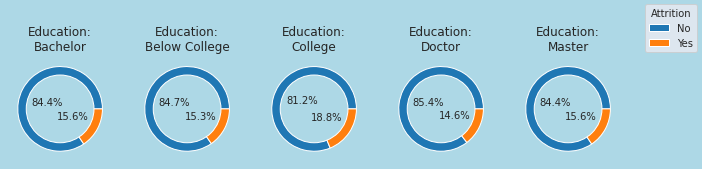

In [ ]:
donut_chart('Education', figsize=(11, 3), pctdistance = .35)

* Empoyess with college education seems to be having a bit more attrition rate than others.

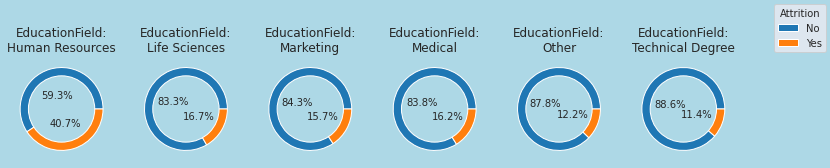

In [ ]:
donut_chart('EducationField', figsize = (13, 3), pctdistance = .35, ncol = 6)

* Empoyess who studied HR have much higher attrition rate than others.
* Empoyess who studied other subjects or with technical degrees have noticable less attrition rate than others.

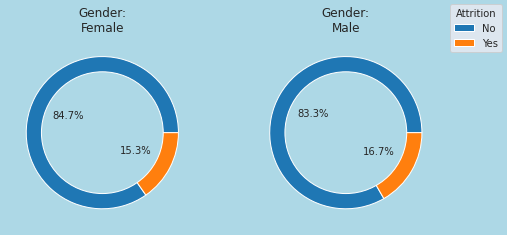

In [ ]:
donut_chart('Gender')

* Males have a little higher attrition rate than females.

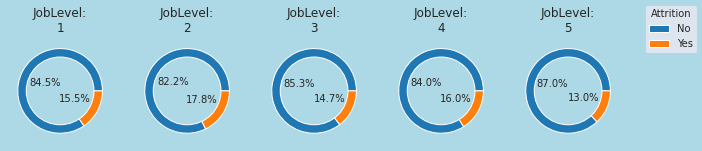

In [ ]:
donut_chart('JobLevel', figsize = (11, 2), pctdistance = .4)

* Job level 2 employees have noticable higher attrition rate than others.
* Job level 5 employees have noticable less attrition rate than others.

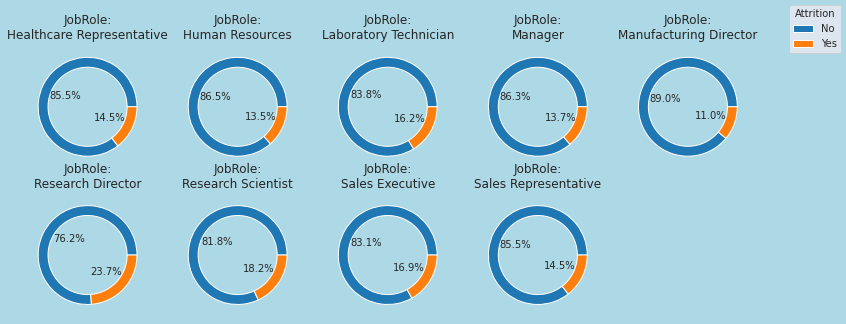

In [ ]:
donut_chart('JobRole', ncol = 5, figsize = (13,5))

* Research Directors have much higher attrition rate than others.
* Manufacturing Directors have much less attrition rate than others.

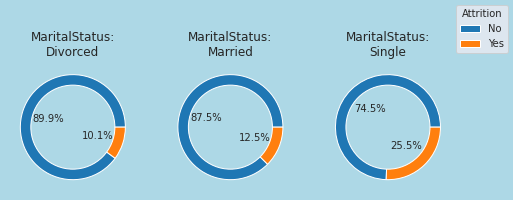

In [ ]:
donut_chart('MaritalStatus')

* Single people have much higher attrition rate than others.

# Data preprocessing

In [17]:
df = data.copy()

Convert Attrition column to 0 and 1, where 1 means "Yes".

In [18]:
df.Attrition = (df.Attrition == 'Yes').astype(int)

Convert BusinessTravel column to numbers where 0 means Non-Travel, and bigger number means more travel.

In [19]:
mapper_bt = dict(zip(np.sort(df.BusinessTravel.unique()), [0, 1, .5]))
mapper_bt

{'Non-Travel': 0, 'Travel_Frequently': 1, 'Travel_Rarely': 0.5}

In [20]:
df.BusinessTravel = df.BusinessTravel.map(mapper_bt)

Convert Education column to numbers where bigger number means more educated.

In [21]:
mapper_ed = dict(zip(np.sort(df.Education.unique()), [.5, 0, .25, 1, .75]))
mapper_ed

{'Bachelor': 0.5,
 'Below College': 0,
 'College': 0.25,
 'Doctor': 1,
 'Master': 0.75}

In [22]:
df.Education = df.Education.map(mapper_ed)

Rename Gender column to Male, with Male takes on the value of 1 and female 0.

In [23]:
df.Gender = df.Gender.str.startswith('M').astype(int)
df.rename(columns = {'Gender': 'Male'}, inplace = True)

Perform one hot encoding

In [24]:
df = pd.get_dummies(df)
df.columns = df.columns.str.replace(' ','_')

Check for missing values

In [25]:
(df.isna().sum(axis = 1) > 0).sum()

28

In [26]:
df.shape

(4410, 38)

Only 28 rows are missing out of 4410 which is less than 1%, these rows will be dropped.

In [27]:
df.dropna(inplace = True)

Add a column "yrs_pct_w_curr_mgr" = YearsWithCurrManager / YearsWithCurrManager

In [28]:
df['yrs_pct_w_curr_mgr'] = (df.YearsWithCurrManager / df.YearsAtCompany).fillna(0)

Check for high correlation columns again

In [29]:
high_corr_col(df)

,column_1,column_2,correlation
562,YearsWithCurrManager,YearsAtCompany,0.769161
721,Department_Sales,Department_Research_&_Development,-0.907200


The new column created seems to solve the high correlation problem between YearsWithCurrManager and YearsAtCompany columns. We'll drop YearsWithCurrManager column.

Add Average daily working hours

In [30]:
wh = log.groupby('EmployeeID').agg({'work_hrs': np.mean})
df = df.merge(wh, on = 'EmployeeID')

Drop YearsWithCurrManager and EmployeeID columns.

In [31]:
df.drop(columns = ['EmployeeID', 'YearsWithCurrManager'], inplace = True)

Split data into predictors(x) and target(y).

In [32]:
x, y = df.drop(columns = 'Attrition'), df.Attrition

Bring data to the same range from 0 to 1.

In [33]:
scaler = mms()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

Check for outliers

In [34]:
def check_outliers(data):
    tdf = data.select_dtypes('number').melt()
    p = sns.boxplot(x = 'value', y = 'variable', data = tdf)
    p.set_xlabel(''); p.set_ylabel('')

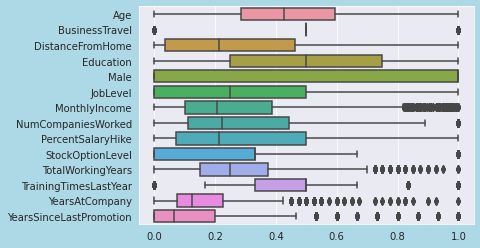

In [35]:
check_outliers(x[[c for c in x.columns if '_' not in c]])

Replace outliers with 1st/3rd quartile -/+ 1.5 * interquartile range.

In [36]:
def replace_outliers(data, columns):
    '''
    Replace outliers with 1st/3rd quartile -/+ 1.5 * interquartile range.
    data(Pandas dataframe): Data
    columns(iterables): Column names to replace outliers.
    Returns dataframe with outliers replaced and dictionary with column name as keys and value as a dictionary with low and high as keys along with the values.
    '''
    ref = {}
    df = data.copy()
    for xx in columns:
        iqr_ = iqr(df[xx])
        low, high = np.percentile(df[xx], [25, 75]) + np.array([-iqr_, iqr_])
        def replace(y):
            if y < low: return low
            if y > high: return high
            return y
        df[xx] = [replace(z) for z in df[xx]]
        ref[xx] = {'low': low, 'high': high}
    return df, ref

In [37]:
x, r = replace_outliers(x, ['MonthlyIncome', 'NumCompaniesWorked', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 
                            'YearsSinceLastPromotion'])

Split data into training and testing data set

In [38]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42, stratify = y)

Check for imbalance data

In [39]:
y.value_counts(True)

0    0.839115
1    0.160885
Name: Attrition, dtype: float64

The data is imbalanced.

Use SMOTE algorithm to balance data.

In [ ]:
x_smote, y_smote = SMOTETomek().fit_resample(x_train, y_train)
x_smote = pd.DataFrame(x_smote, columns = x_train.columns)

# Machine learning

## Compare 3 kinds of models

In [43]:
scores = []
for m in [SVC, LogisticRegression, RandomForestClassifier]:
    scores += [cross_val_score(m(), x_smote, y_smote, scoring = 'f1', cv = 5).mean()]
compare = pd.DataFrame({'Model': ['SVM', 'Logistic Regression', 'Random Forest'], 'F1 CV score': scores})
compare

,Model,F1 CV score
0,SVM,0.925425
1,Logistic Regression,0.746860
2,Random Forest,0.983653


* Random forest seems to be performing much better than others.

## Attempt to find better parameters to improve the model performance.

In [ ]:
params = {'n_estimators': [50 , 100, 200, 400], 'criterion': ['gini', 'entropy'], 'min_samples_leaf': [1, 5, 10], 'max_features': ['sqrt', 'log2']}
clf = RandomizedSearchCV(RandomForestClassifier(), params, n_iter = 16, scoring = 'f1')
_ = clf.fit(x_smote, y_smote)

In [53]:
clf.best_score_

0.9841093885148593

* The score seems to improve a little bit.

# Model performance with unseen data.

In [46]:
print(rep(y_test, clf.predict(x_test)))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1214
           1       0.96      0.91      0.93       233

    accuracy                           0.98      1447
   macro avg       0.97      0.95      0.96      1447
weighted avg       0.98      0.98      0.98      1447



* The testing data shows the model can predict the employees who left with an accuracy of 91%. This is a very good model considering that there's only around 16% of employess who left in the data.

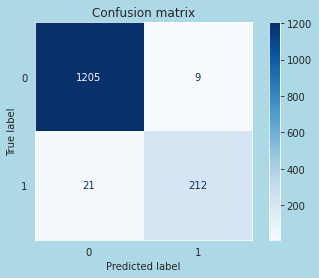

In [51]:
_ = metrics.plot_confusion_matrix(clf, x_test, y_test, cmap = 'Blues', values_format = 'd')
plt.grid(False)
_ = plt.title('Confusion matrix')

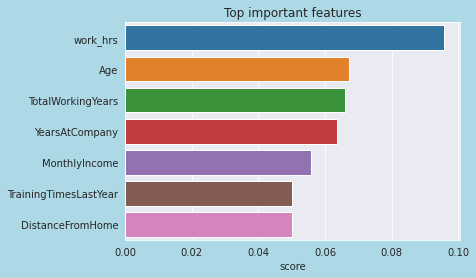

In [48]:
tdf = pd.DataFrame({'feature': x_smote.columns, 'score': clf.best_estimator_.feature_importances_})
tdf.sort_values('score', ascending = False, inplace = True)
p = sns.barplot(x = 'score', y = 'feature', data = tdf.head(7))
p.set_title('Top important features')
_ = p.set_ylabel('')

## Recommendations and insights

* Average daily working hours is by far the most important feature at predicting whether the employees will leave or not. The working hours of employess might need some adjustments in order to keep employees from leaving the company. According to earlier graphs, employees who left had higher average daily working hours than those who stayed.
* Besides average daily working hours, age, total working years, and years at company also plays the important roles at predicting employees attrition. they are about equally important.
* Looking back at the graphs earlier, it seems that employees who left were generally yunger than those who stayed. This could be due to the fact that yunger people just started their career, and they need a better position with better pay after some working exerience. Perhaps the company could try to figure out what these yung people are looking for, and offer better position if possible. However this could also be due to other reasons, which needs further investifation.
* For total working years, it's because that a lot of them are yung or career starter. The company could do the same thing as with yung people. Figure out what they are looking for, and offer that if possible.
* Looking back at the graphs earlier, we could see employees who left have lower average years at company than those who stayed. Perhaps the company could check in with the employees who have bad response to the survey and the bad score from manager survey for them especially for employess who has little years at company. This way the company could have identify the problems the employees are facing and fix it to prevent employees leaving. 